EXPLORATORY DATA ANALYSIS


In [ ]:
!pip install pretty_midi
!sudo apt install -y fluidsynth
!pip install --upgrade pyfluidsynth

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 37.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 5.2 MB/s eta 0:00:00
  Created wheel for pretty_midi: filename=pretty_midi-0.2.10-py3-none-any.whl size=5592285 sha256=9176efdeec825b6ab1305032dd3f20faab5ae504e80c22e5026ad174fc4691de
  Stored in directory: /root/.cache/pip/wheels/cd/a5/30/7b8b7f58709f5150f67f98fde4b891ebf0be9ef07a8af49f25
Successfully built pretty_midi
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-x

In [ ]:
import pandas as pd
import numpy as np
import tensorflow
import seaborn as sns
import pretty_midi
import fluidsynth
import matplotlib.pyplot as plt
import seaborn as sns
import collections
from typing import Optional
from IPython import display
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [ ]:
!unzip /content/midi_songs.zip

Archive:  /content/midi_songs.zip
  inflating: midi_songs/0fithos.mid  
  inflating: midi_songs/8.mid        
  inflating: midi_songs/ahead_on_our_way_piano.mid  
  inflating: midi_songs/AT.mid       
  inflating: midi_songs/balamb.mid   
  inflating: midi_songs/bcm.mid      
  inflating: midi_songs/BlueStone_LastDungeon.mid  
  inflating: midi_songs/braska.mid   
  inflating: midi_songs/caitsith.mid  
  inflating: midi_songs/Cids.mid     
  inflating: midi_songs/cosmo.mid    
  inflating: midi_songs/costadsol.mid  
  inflating: midi_songs/dayafter.mid  
  inflating: midi_songs/decisive.mid  
  inflating: midi_songs/dontbeafraid.mid  
  inflating: midi_songs/DOS.mid      
  inflating: midi_songs/electric_de_chocobo.mid  
  inflating: midi_songs/Eternal_Harvest.mid  
  inflating: midi_songs/EyesOnMePiano.mid  
  inflating: midi_songs/ff11_awakening_piano.mid  
  inflating: midi_songs/ff1battp.mid  
  inflating: midi_songs/FF3_Battle_(Piano).mid  
  inflating: midi_songs/FF3_Third_Phase_

## Loading Data

In [ ]:
import os
path ='/content/midi_songs'
filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root,file))

In [ ]:
filelist = filelist[4:]

In [ ]:
for i in range(25):
    print(filelist[i])

/content/midi_songs/tifap.mid
/content/midi_songs/ff4-town.mid
/content/midi_songs/DOS.mid
/content/midi_songs/Still_Alive-1.mid
/content/midi_songs/FFX_-_Ending_Theme_(Piano_Version)_-_by_Angel_FF.mid
/content/midi_songs/FF3_Battle_(Piano).mid
/content/midi_songs/bcm.mid
/content/midi_songs/Rydia_pc.mid
/content/midi_songs/Gold_Silver_Rival_Battle.mid
/content/midi_songs/FFIX_Piano.mid
/content/midi_songs/balamb.mid
/content/midi_songs/Ff7-Jenova_Absolute.mid
/content/midi_songs/ff4_piano_collections-main_theme.mid
/content/midi_songs/Oppressed.mid
/content/midi_songs/lurk_in_dark.mid
/content/midi_songs/ultimafro.mid
/content/midi_songs/ff4pclov.mid
/content/midi_songs/Rachel_Piano_tempofix.mid
/content/midi_songs/ultros.mid
/content/midi_songs/AT.mid
/content/midi_songs/FF6epitaph_piano.mid
/content/midi_songs/ff4-airship.mid
/content/midi_songs/sera_.mid
/content/midi_songs/FF3_Third_Phase_Final_(Piano).mid
/content/midi_songs/braska.mid


## Exploratory Data Analysis

In [ ]:
def find_song(name: str, artist: Optional[str] = None):
    name = name.replace(' ', '_')
    x=None
    for file in filelist:
        if file.find(name)>0:
            if artist:
                if file.find(artist)>0:
                    x = filelist.index(file)
            else:
                x = filelist.index(file)
    return x

In [ ]:
file = filelist[find_song("JENOVA")]
midiFile = pretty_midi.PrettyMIDI(file)

In [ ]:
midiFile

In [ ]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds: int):
    waveform = pm.fluidsynth(fs=16000.0)
    waveform_short = waveform[:seconds*16000]
    return display.Audio(waveform_short, rate=16000.0)

In [ ]:
def play_song(name: str, artist: Optional[str] = None):
    name = name.replace(' ', '_')
    if artist:
        artist = artist.replace(' ', '_')
    index = find_song(name,artist)
    try:
        file = filelist[index]
    except:
        print("Song name does not exist")
    else:
        try:
            midiFile = pretty_midi.PrettyMIDI(file)
            return display_audio(midiFile,1000)
        except:
            print("Could not process file")

In [ ]:
play_song("JENOVA")

In [ ]:
play_song("dayafter")

In [ ]:
print('Number of instruments:', len(midiFile.instruments))
for instrument in midiFile.instruments:
    instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
    print(instrument_name)

Number of instruments: 2
Acoustic Grand Piano
Acoustic Grand Piano


In [ ]:
instrument = midiFile.instruments[1]

In [ ]:
instrument

Instrument(program=0, is_drum=False, name="Left Hand")

In [ ]:
print(midiFile.instruments)

[Instrument(program=0, is_drum=False, name="Right Hand"), Instrument(program=0, is_drum=False, name="Left Hand")]


In [ ]:
for i, note in enumerate(instrument.notes[:10]):
    note_name = pretty_midi.note_number_to_name(note.pitch)
    duration = note.end - note.start
    print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=38, note_name=D2, duration=0.2778
1: pitch=38, note_name=D2, duration=0.2778
2: pitch=38, note_name=D2, duration=0.2778
3: pitch=38, note_name=D2, duration=0.2778
4: pitch=38, note_name=D2, duration=0.2778
5: pitch=38, note_name=D2, duration=0.2778
6: pitch=38, note_name=D2, duration=0.2778
7: pitch=38, note_name=D2, duration=0.2778
8: pitch=38, note_name=D2, duration=0.2778
9: pitch=38, note_name=D2, duration=0.2778


In [ ]:
def midi_to_notes(midi_file: str, instrument: midiFile.instruments) -> pd.DataFrame:
    pm = pretty_midi.PrettyMIDI(midi_file)
    notes = collections.defaultdict(list)

    # Sort the notes by start time
    sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
    prev_start = sorted_notes[0].start

    for note in sorted_notes:
        start = note.start
        end = note.end
        notes['pitch'].append(note.pitch)
        notes['start'].append(start)
        notes['end'].append(end)
        notes['step'].append(start - prev_start)
        notes['duration'].append(end - start)
        notes['instrument'].append(pretty_midi.program_to_instrument_name(instrument.program))
        prev_start = start

    return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [ ]:
notes = midi_to_notes(file,instrument)
notes

,pitch,start,end,step,duration,instrument
0,38,5.333328,5.611105,0.000000,0.277778,Acoustic Grand Piano
1,38,5.666661,5.944439,0.333333,0.277778,Acoustic Grand Piano
2,38,5.999994,6.277772,0.333333,0.277778,Acoustic Grand Piano
3,38,6.333327,6.611104,0.333333,0.277778,Acoustic Grand Piano
4,38,6.666660,6.944438,0.333333,0.277778,Acoustic Grand Piano
...,...,...,...,...,...,...
355,36,131.666535,131.944312,0.333333,0.277777,Acoustic Grand Piano
356,36,131.999868,132.277646,0.333333,0.277778,Acoustic Grand Piano
357,36,132.333201,132.610979,0.333333,0.277778,Acoustic Grand Piano
358,36,132.666534,132.944311,0.333333,0.277777,Acoustic Grand Piano


In [ ]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
    if count:
        title = f'First {count} notes'
    else:
        title = f'Whole track'
        count = len(notes['pitch'])
    plt.figure(figsize=(20, 4))
    plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
    plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
    plt.plot(
        plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
    plt.xlabel('Time [s]')
    plt.ylabel('Pitch')
    _ = plt.title(title)

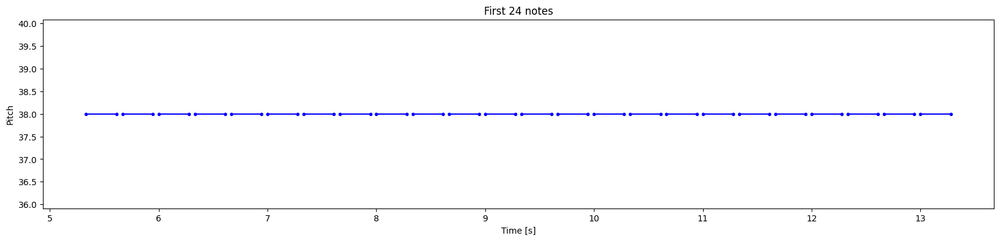

In [ ]:
plot_piano_roll(notes, count=24)

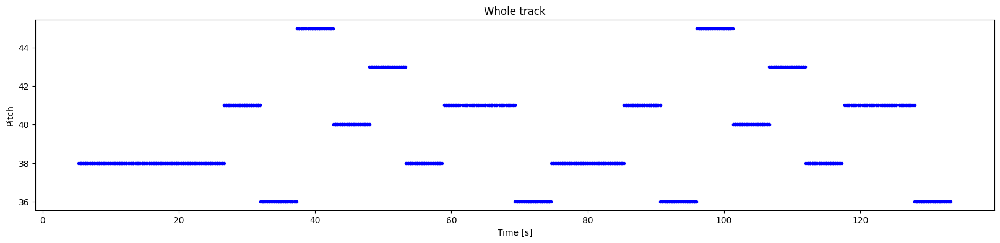

In [ ]:
plot_piano_roll(notes)

In [ ]:
def instrument_to_num(df: pd.Series()):
    df = df.map({"Acoustic Grand Piano":0,
"Bright Acoustic Piano":1,
"Electric Grand Piano":2,
"Honky-tonk Piano":3,
"Electric Piano 1":4,
"Electric Piano 2":5,
"Harpsichord":6,
"Clavinet":7,

"Celesta":8,
'Glockenspiel':9,
"Music Box":10,
'Vibraphone':11,
'Marimba':12,
'Xylophone':13,
'Tubular Bells':14,
'Dulcimer':15,

'Drawbar Organ':16,
'Percussive Organ':17,
'Rock Organ':18,
'Church Organ':19,
'Reed Organ':20,
'Accordion':21,
'Harmonica':22,
'Tango Accordion':23,

'Acoustic Guitar (nylon)':24,
'Acoustic Guitar (steel)':25,
'Electric Guitar (jazz)':26,
'Electric Guitar (clean)':27,
'Electric Guitar (muted)':28,
'Overdriven Guitar':29,
'Distortion Guitar':30,
'Guitar Harmonics':31,

'Acoustic Bass':32,
'Electric Bass (finger)':33,
'Electric Bass (pick)':34,
'Fretless Bass':35,
'Slap Bass 1':36,
'Slap Bass 2':37,
'Synth Bass 1':38,
'Synth Bass 2':39,

'Violin':40,
'Viola':41,
'Cello':42,
'Contrabass':43,
'Tremolo Strings':44,
'Pizzicato Strings':45,
'Orchestral Harp':46,
'Timpani':47,

'String Ensemble 1':48,
'String Ensemble 2':49,
'Synth Strings 1':50,
'Synth Strings 2':51,
'Choir Aahs':52,
'Voice Oohs':53,
'Synth Choir':54,
'Orchestra Hit':55,

'Trumpet':56,
'Trombone':57,
'Tuba':58,
'Muted Trumpet':59,
'French Horn':60,
'Brass Section':61,
'Synth Brass 1':62,
'Synth Brass 2':63,

'Soprano Sax':64,
'Alto Sax':65,
'Tenor Sax':66,
'Baritone Sax':67,
'Oboe':68,
'English Horn':69,
'Bassoon':70,
'Clarinet':71,

'Piccolo':72,
'Flute':73,
'Recorder':74,
'Pan Flute':75,
'Blown bottle':76,
'Shakuhachi':77,
'Whistle':78,
'Ocarina':79,

'Lead 1 (square)':80,
'Lead 2 (sawtooth)':81,
'Lead 3 (calliope)':82,
'Lead 4 chiff':83,
'Lead 5 (charang)':84,
'Lead 6 (voice)':85,
'Lead 7 (fifths)':86,
'Lead 8 (bass + lead)':87,

'Pad 1 (new age)':88,
'Pad 2 (warm)':89,
'Pad 3 (polysynth)':90,
'Pad 4 (choir)':91,
'Pad 5 (bowed)':92,
'Pad 6 (metallic)':93,
'Pad 7 (halo)':94,
'Pad 8 (sweep)':95,

'FX 1 (rain)':96,
'FX 2 (soundtrack)':97,
'FX 3 (crystal)':98,
'FX 4 (atmosphere)':99,
'FX 5 (brightness)':100,
'FX 6 (goblins)':101,
'FX 7 (echoes)':102,
'FX 8 (sci-fi)':103,

'Sitar':104,
'Banjo':105,
'Shamisen':106,
'Koto':107,
'Kalimba':108,
'Bagpipe':109,
'Fiddle':110,
'Shanai':111,

'Tinkle Bell':112,
'Agogo':113,
'Steel Drums':114,
'Woodblock':115,
'Taiko Drum':116,
'Melodic Tom':117,
'Synth Drum':118,

'Reverse Cymbal':119,
'Guitar Fret Noise':120,
'Breath Noise':121,
'Seashore':122,
'Bird Tweet':123,
'Telephone Ring':124,
'Helicopter':125,
'Applause':126,
'Gunshot':127})
    return df

In [ ]:
df = pd.DataFrame()
for instrument in midiFile.instruments:
    notes = midi_to_notes(file,instrument)
    df = pd.concat([df, notes], ignore_index=True)

In [ ]:
df.instrument = instrument_to_num(df.instrument)
df

,pitch,start,end,step,duration,instrument
0,82,0.000000,0.163194,0.000000,0.163194,0
1,81,0.166666,0.329861,0.166666,0.163194,0
2,77,0.333333,0.496527,0.166666,0.163194,0
3,74,0.499999,0.663194,0.166666,0.163194,0
4,70,0.666666,0.829860,0.166666,0.163194,0
...,...,...,...,...,...,...
762,36,131.666535,131.944312,0.333333,0.277777,0
763,36,131.999868,132.277646,0.333333,0.277778,0
764,36,132.333201,132.610979,0.333333,0.277778,0
765,36,132.666534,132.944311,0.333333,0.277777,0


In [ ]:
output = pd.DataFrame({'pitch': df['pitch'], 'start': df['start'], 'end': df['end'], 'step': df['step'], 'duration': df['duration'], 'instrument': df['instrument']})
output.to_csv('SampleSong.csv', index=False)

In [ ]:
indexes = []
for i in range(17233):
    indexes.append(i)
import random
random.seed(10)
random.shuffle(indexes)

In [ ]:
def convert_data(num: int):
    num = num*1000
    df = pd.DataFrame()
    for i in range(num-1000,17233):
        print(i, end=" ")
        if((i+1)%25==0):
            print("")
        file = filelist[i]
        try:
            midiFile = pretty_midi.PrettyMIDI(file)
            for instrument in midiFile.instruments:
                notes = midi_to_notes(file,instrument)
                df = pd.concat([df, notes], ignore_index=True)
        except:
            pass
    df.instrument = instrument_to_num(df.instrument)
    output = pd.DataFrame({'pitch': df['pitch'], 'start': df['start'], 'end': df['end'], 'step': df['step'], 'duration': df['duration'], 'instrument': df['instrument']})
    output.to_csv('Fulldf-'+str(int(num/1000))+'.csv', index=False)
    print("Done")

In [ ]:
import pandas as pd
import pretty_midi

def convert_data(num: int):
    num = num * 1000
    df = pd.DataFrame()
    for i in range(num, num + 88):  # Iterate over the first 92 elements
        print(i, end=" ")
        if ((i + 1) % 25 == 0):
            print("")
        file = filelist[i]
        try:
            midiFile = pretty_midi.PrettyMIDI(file)
            for instrument in midiFile.instruments:
                notes = midi_to_notes(file, instrument)
                df = pd.concat([df, notes], ignore_index=True)
        except:
            pass
    df.instrument = instrument_to_num(df.instrument)
    output = pd.DataFrame({
        'pitch': df['pitch'],
        'start': df['start'],
        'end': df['end'],
        'step': df['step'],
        'duration': df['duration'],
        'instrument': df['instrument']
    })
    output.to_csv('Fulldf-' + str(int(num / 1000)) + '.csv', index=False)
    print("Done")


In [ ]:
print(len(filelist))
convert_data(0)


88
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 
25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 
50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 
75 76 77 78 79 80 81 82 83 84 85 86 87 Done


In [ ]:
output

,pitch,start,end,step,duration,instrument
0,82,0.000000,0.163194,0.000000,0.163194,0
1,81,0.166666,0.329861,0.166666,0.163194,0
2,77,0.333333,0.496527,0.166666,0.163194,0
3,74,0.499999,0.663194,0.166666,0.163194,0
4,70,0.666666,0.829860,0.166666,0.163194,0
...,...,...,...,...,...,...
762,36,131.666535,131.944312,0.333333,0.277777,0
763,36,131.999868,132.277646,0.333333,0.277778,0
764,36,132.333201,132.610979,0.333333,0.277778,0
765,36,132.666534,132.944311,0.333333,0.277777,0


In [ ]:
from google.colab import files

# Specify the file you want to download
file_to_download = "Fulldf-0.csv"

# Generate a download link
files.download(file_to_download)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>